# **Airline Customer Value Analysis Case**
---

# Import Library

In [1]:
# Data manipulation
import pandas as pd
import numpy as np

# Data visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import plotly.express as px
import plotly.graph_objs as go

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Read Data

In [3]:
!gdown 14G4xOWK5e-QQ9S7GmBwULChNdeJZXs2U

Downloading...
From: https://drive.google.com/uc?id=14G4xOWK5e-QQ9S7GmBwULChNdeJZXs2U
To: /content/flight.csv
100% 8.94M/8.94M [00:00<00:00, 259MB/s]


In [4]:
# Read data
df = pd.read_csv('flight.csv')

# Check the sample
df.sample(n = 5, random_state = 400)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
62293,46664,10/20/2011,1/16/2012,Male,4,shenzhen,guangdong,CN,38.0,3/31/2014,2,428,802.0,0.0,2130,1/28/2013,429,256.000000,256,0,0.362207,428,0
24535,37712,5/3/2012,10/29/2012,Male,4,wulumuqi,xinjiang,CN,49.0,3/31/2014,5,6676,5081.0,2217.0,19054,7/3/2013,273,61.750000,224,0,0.512314,6676,0
45885,53187,9/23/2011,9/23/2011,Male,4,haerbin,heilongjiang,CN,37.0,3/31/2014,5,1860,0.0,2752.0,7587,3/6/2014,26,77.250000,203,0,0.456537,1860,0
82,18111,9/19/2008,9/19/2008,Male,6,wulumuqi,xinjiang,CN,44.0,3/31/2014,56,149456,44503.0,78197.0,116728,3/30/2014,2,11.472727,68,5,1.394864,164783,8
38707,13296,1/23/2012,10/17/2012,Male,4,guilin,guangxi,CN,39.0,3/31/2014,6,5294,5632.0,0.0,5197,3/26/2013,372,32.000000,69,0,0.950895,5294,0


# 0. Data Understanding

## 0.1. Features Definition

| Feature Name              | Feature Description                 |
|---------------------------|----------------------------|
| MEMBER_NO                 | ID Member                      |
| FFP_DATE                  | Join Date                        |
| FIRST_FLIGHT_DATE         | Tanggal Penerbangan Pertama                     |
| GENDER                    | Jenis Kelamin                     |
| FFP_TIER                  | Tier dari Frequent Flyer Program                     |
| WORK_CITY                 | Kota Asal                        |
| WORK_PROVINCE             | Provinsi Asal                        |
| WORK_COUNTRY              | Negara Asal                        |
| AGE                       | Umur Customer                    |
| LOAD_TIME                 | Tanggal Data Diambil                     |
| FLIGHT_COUNT              | Jumlah Penerbangan Customer                    |
| BP_SUM                    | Rencana Perjalanan                  |
| SUM_YR_1                  | Fare Revenue                     |
| SUM_YR_2                  | Votes Price Income                |
| SEG_KM_SUM                | Total Jarak (km) Penerbangan yang Sudah Dilakukan                     |
| LAST_FLIGHT_DATE          | Tanggal Penerbangan Terakhir                    |
| LAST_TO_END               | Jarak waktu Penerbangan Terakhir ke Pesanan Penerbangan Terakhir                       |
| AVG_INTERVAL              | Rerata Jarak Waktu                       |
| MAX_INTERVAL              | Maksimal Jarak Waktu                       |
| EXCHANGE_COUNT            | Jumlah Penukaran                   |
| AVG_DISCOUNT              | Rerate Discount yang Didapat Customer       |
| POINTS_SUM                | Jumlah Poin yang Didapat Customer            |
| POINTS_NOT_FLIGHT           | Point yang Tidak Digunakan oleh Customer     |


In [5]:
# Rename features
df.rename(columns = {'avg_discount'    : 'AVG_DISCOUNT',
                     'Points_Sum'      : 'POINTS_SUM',                     
                     'Point_NotFlight' : 'POINTS_NOT_FLIGHT'},
          inplace = True)

In [6]:
df.dtypes

MEMBER_NO              int64
FFP_DATE              object
FIRST_FLIGHT_DATE     object
GENDER                object
FFP_TIER               int64
WORK_CITY             object
WORK_PROVINCE         object
WORK_COUNTRY          object
AGE                  float64
LOAD_TIME             object
FLIGHT_COUNT           int64
BP_SUM                 int64
SUM_YR_1             float64
SUM_YR_2             float64
SEG_KM_SUM             int64
LAST_FLIGHT_DATE      object
LAST_TO_END            int64
AVG_INTERVAL         float64
MAX_INTERVAL           int64
EXCHANGE_COUNT         int64
AVG_DISCOUNT         float64
POINTS_SUM             int64
POINTS_NOT_FLIGHT      int64
dtype: object

## 0.2. Dimensions of the DataFrame

In [7]:
df.shape

(62988, 23)

In [8]:
print('Dataset ini memiliki dimensi data, yaitu')
print('Jumlah baris: {}'.format(df.shape[0]))
print('Jumlah kolom: {}'.format(df.shape[1]))

Dataset ini memiliki dimensi data, yaitu
Jumlah baris: 62988
Jumlah kolom: 23


## 0.3. Data Types of the Columns

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MEMBER_NO          62988 non-null  int64  
 1   FFP_DATE           62988 non-null  object 
 2   FIRST_FLIGHT_DATE  62988 non-null  object 
 3   GENDER             62985 non-null  object 
 4   FFP_TIER           62988 non-null  int64  
 5   WORK_CITY          60719 non-null  object 
 6   WORK_PROVINCE      59740 non-null  object 
 7   WORK_COUNTRY       62962 non-null  object 
 8   AGE                62568 non-null  float64
 9   LOAD_TIME          62988 non-null  object 
 10  FLIGHT_COUNT       62988 non-null  int64  
 11  BP_SUM             62988 non-null  int64  
 12  SUM_YR_1           62437 non-null  float64
 13  SUM_YR_2           62850 non-null  float64
 14  SEG_KM_SUM         62988 non-null  int64  
 15  LAST_FLIGHT_DATE   62988 non-null  object 
 16  LAST_TO_END        629

- Fitur `FFP_DATE`, `FIRST_FLIGHT_DATE`, `LOAD_TIME`, dan `LAST_FLIGHT_DATE` seharusnya memiliki tipe data _datetime_.
- Fitur `AGE` sebaiknya _integer_.

## 0.4. Detect Missing Values

In [10]:
# Detect missing value
df.isna().any()

MEMBER_NO            False
FFP_DATE             False
FIRST_FLIGHT_DATE    False
GENDER                True
FFP_TIER             False
WORK_CITY             True
WORK_PROVINCE         True
WORK_COUNTRY          True
AGE                   True
LOAD_TIME            False
FLIGHT_COUNT         False
BP_SUM               False
SUM_YR_1              True
SUM_YR_2              True
SEG_KM_SUM           False
LAST_FLIGHT_DATE     False
LAST_TO_END          False
AVG_INTERVAL         False
MAX_INTERVAL         False
EXCHANGE_COUNT       False
AVG_DISCOUNT         False
POINTS_SUM           False
POINTS_NOT_FLIGHT    False
dtype: bool

In [11]:
# Summarize missing value
counts = df.isna().sum().sort_values(ascending = False)
percents = round(df.isna().mean() * 100, 2).sort_values(ascending = False)

na = pd.concat([counts, percents], axis = 1, keys = ['NA Counts', '%'])
na

,NA Counts,%
WORK_PROVINCE,3248,5.16
WORK_CITY,2269,3.60
SUM_YR_1,551,0.87
AGE,420,0.67
SUM_YR_2,138,0.22
WORK_COUNTRY,26,0.04
GENDER,3,0.00
MEMBER_NO,0,0.00
LAST_FLIGHT_DATE,0,0.00
POINTS_SUM,0,0.00


In [12]:
df.isna().sum().sum()

6655

- Fitur-fitur yang memiliki _missing values_: `WORK_CITY`, `WORK_PROVINCE`, `WORK_COUNTRY`, `SUM_YR_1`, `SUM_YR_2`, `AGE`, dan `GENDER`.
- Dataset ini memiliki data yang kosong sekitar 10%.

## 0.5. Detect Duplicate Values

In [13]:
# Detect duplicate value
df.duplicated().sum()

0

- Tidak ada data yang duplikat.

## 0.6. Number of Unique Classes

In [14]:
# Count number of unique class
uniques = df.nunique().sort_values(ascending = False)
uniques

MEMBER_NO            62988
AVG_DISCOUNT         54179
SEG_KM_SUM           29081
POINTS_SUM           25062
BP_SUM               23449
SUM_YR_2             16767
SUM_YR_1             15828
AVG_INTERVAL         10706
FIRST_FLIGHT_DATE     3406
WORK_CITY             3234
FFP_DATE              3068
WORK_PROVINCE         1165
LAST_FLIGHT_DATE       731
LAST_TO_END            731
MAX_INTERVAL           706
FLIGHT_COUNT           153
WORK_COUNTRY           118
POINTS_NOT_FLIGHT       99
AGE                     84
EXCHANGE_COUNT          28
FFP_TIER                 3
GENDER                   2
LOAD_TIME                1
dtype: int64

# 1. Exploratory Data Analysis (EDA)

# 1.0. Descriptive Statistics

In [15]:
df.columns

Index(['MEMBER_NO', 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'GENDER', 'FFP_TIER',
       'WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY', 'AGE', 'LOAD_TIME',
       'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM',
       'LAST_FLIGHT_DATE', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL',
       'EXCHANGE_COUNT', 'AVG_DISCOUNT', 'POINTS_SUM', 'POINTS_NOT_FLIGHT'],
      dtype='object')

In [16]:
num = df.select_dtypes(exclude = ['object'])
cat = df.select_dtypes(include = ['object'])

## 1.0.1. Numerical Features

In [17]:
num.columns

Index(['MEMBER_NO', 'FFP_TIER', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1',
       'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL',
       'EXCHANGE_COUNT', 'AVG_DISCOUNT', 'POINTS_SUM', 'POINTS_NOT_FLIGHT'],
      dtype='object')

In [18]:
num.describe(percentiles = [0.25, 0.5, 0.75, 0.9, 0.95]).T

,count,mean,std,min,25%,50%,75%,90%,95%,max
MEMBER_NO,62988.0,31494.500000,18183.213715,1.0,15747.750000,31494.500000,47241.250000,56689.30,59838.65,62988.0
FFP_TIER,62988.0,4.102162,0.373856,4.0,4.000000,4.000000,4.000000,4.00,5.00,6.0
AGE,62568.0,42.476346,9.885915,6.0,35.000000,41.000000,48.000000,56.00,60.00,110.0
FLIGHT_COUNT,62988.0,11.839414,14.049471,2.0,3.000000,7.000000,15.000000,27.00,39.00,213.0
BP_SUM,62988.0,10925.081254,16339.486151,0.0,2518.000000,5700.000000,12831.000000,25494.00,37694.60,505308.0
SUM_YR_1,62437.0,5355.376064,8109.450147,0.0,1003.000000,2800.000000,6574.000000,13010.00,19210.60,239560.0
SUM_YR_2,62850.0,5604.026014,8703.364247,0.0,780.000000,2773.000000,6845.750000,14100.00,20935.40,234188.0
SEG_KM_SUM,62988.0,17123.878691,20960.844623,368.0,4747.000000,9994.000000,21271.250000,39729.60,56021.60,580717.0
LAST_TO_END,62988.0,176.120102,183.822223,1.0,29.000000,108.000000,268.000000,483.00,579.00,731.0
AVG_INTERVAL,62988.0,67.749788,77.517866,0.0,23.370370,44.666667,82.000000,146.00,209.00,728.0


In [19]:
num.describe().loc[['mean', '50%']].T

,mean,50%
MEMBER_NO,31494.500000,31494.500000
FFP_TIER,4.102162,4.000000
AGE,42.476346,41.000000
FLIGHT_COUNT,11.839414,7.000000
BP_SUM,10925.081254,5700.000000
SUM_YR_1,5355.376064,2800.000000
SUM_YR_2,5604.026014,2773.000000
SEG_KM_SUM,17123.878691,9994.000000
LAST_TO_END,176.120102,108.000000
AVG_INTERVAL,67.749788,44.666667


- Mayoritas data memiliki nilai mean > median (P50), sehingga cenderung berdistribusi _right skewed_ (_positively skewed_).
- Fitur `MEMBER_NO`, `AGE`, dan `AVG_DISCOUNT` memiliki nilai mean yang hampir sama dengan median, sehingga cenderung mendekati distribusi normal.
- Usia _customer_ yang tertua adalah 110 tahun.

## 1.0.2. Categorical Features

In [20]:
cat.columns

Index(['FFP_DATE', 'FIRST_FLIGHT_DATE', 'GENDER', 'WORK_CITY', 'WORK_PROVINCE',
       'WORK_COUNTRY', 'LOAD_TIME', 'LAST_FLIGHT_DATE'],
      dtype='object')

In [21]:
cat.describe().T

,count,unique,top,freq
FFP_DATE,62988,3068,1/13/2011,184
FIRST_FLIGHT_DATE,62988,3406,2/16/2013,96
GENDER,62985,2,Male,48134
WORK_CITY,60719,3234,guangzhou,9386
WORK_PROVINCE,59740,1165,guangdong,17509
WORK_COUNTRY,62962,118,CN,57748
LOAD_TIME,62988,1,3/31/2014,62988
LAST_FLIGHT_DATE,62988,731,3/31/2014,959


In [22]:
df['GENDER'].value_counts(normalize = True)

Male      0.764214
Female    0.235786
Name: GENDER, dtype: float64

In [23]:
df['WORK_COUNTRY'].value_counts(normalize = True)['CN']

0.9171881452304564

In [24]:
df['WORK_PROVINCE'].value_counts(normalize = True)['guangdong']

0.29308670907264817

In [25]:
df['WORK_CITY'].value_counts(normalize = True)['guangzhou']

0.154580938421252

- Mayoritas _customer_ yang melakukan penerbangan adalah laki-laki.
- Mayoritas _customer_ berasal dari kota `Guangzhou` (15,5%).
- Mayoritas _customer_ berasal dari provinsi `Guangdong` (29,3%).
- Negara dengan kode `CN` merupakan negara asal mayoritas _customer_, yaitu sebanyak 91,7%.

# 1.1. Data Visualization

In [26]:
df_num = num.columns
df_cat = cat.columns

In [27]:
len(df_num)

15

In [28]:
len(df_cat)

8

In [29]:
print(f'Dataset ini memiliki {len(df_num)} fitur numerikal dan {len(df_cat)} fitur kategorikal.')

Dataset ini memiliki 15 fitur numerikal dan 8 fitur kategorikal.


## 1.1.1. Univariate Analysis

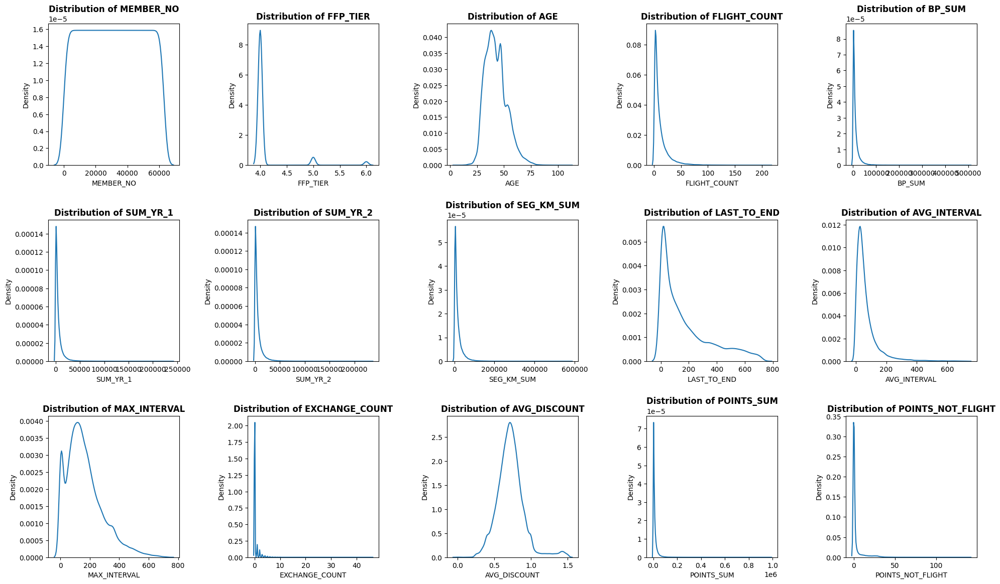

In [30]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 20, 12

# Pengecekan distribusi dari fitur numerical menggunakan kdeplot
for i in range(0, len(df_num)):
    plt.subplot(3, 5, i + 1)
    sns.kdeplot(x = df[df_num[i]])
    plt.xlabel(df_num[i])
    plt.title('Distribution of ' + df_num[i],
              fontsize = 12,
              fontweight = 'bold')
    plt.tight_layout(pad = 2)

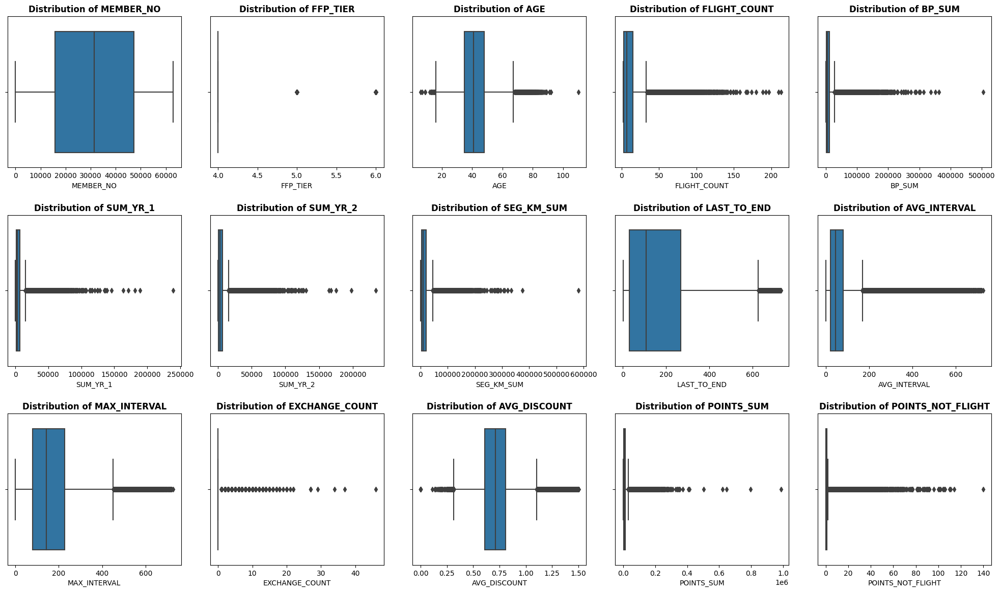

In [31]:
# Pengecekan distribusi dari fitur numerical menggunakan boxplot
for i in range(0, len(df_num)):
    plt.subplot(3, 5, i + 1)
    sns.boxplot(x = df[df_num[i]],
                orient = 'h')
    plt.title('Distribution of ' + df_num[i],
              fontsize = 12,
              fontweight = 'bold')
    plt.tight_layout(pad = 2)

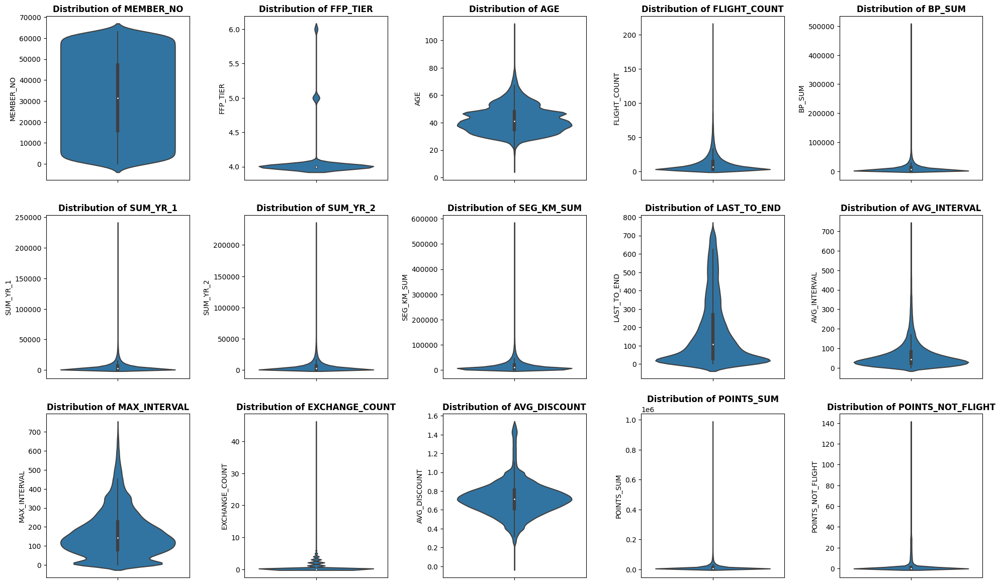

In [32]:
# Pengecekan distribusi dari fitur numerical menggunakan violinplot
for i in range(0, len(df_num)):
    plt.subplot(3, 5, i + 1)
    sns.violinplot(y = df[df_num[i]],
                   orient = 'v')
    plt.title('Distribution of ' + df_num[i],
              fontsize = 12,
              fontweight = 'bold')
    plt.tight_layout(pad = 2)

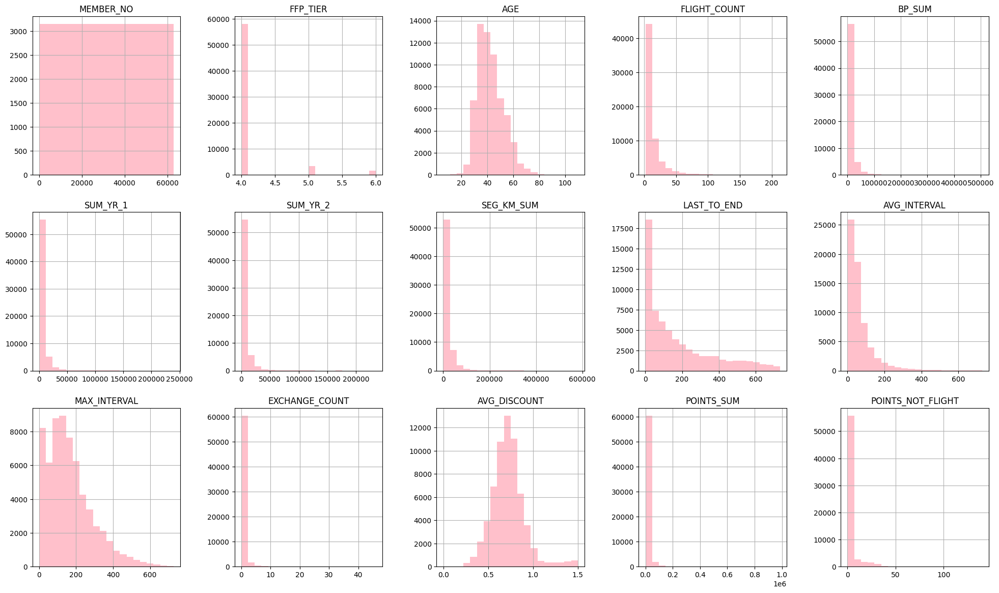

In [33]:
df.hist(bins = 20, figsize = (20, 12), layout = (3, 5), color = 'pink')
plt.tight_layout(pad = 2)
plt.show()

Dari distribusi data di atas dapat dilihat bahwa:
- Sebagian besar fitur memiliki distribusi yang _positively skewed_, karena nilai mean > median.
- Sebagian besar fitur memiliki _outlier_ atau pencilan.

Pada saat data pre-processing, kita perlu melakukan:
- Penghapusan _outlier_ pada setiap fitur bisa menggunakan IQR atau Z-Score.
- Melakukan _Data Transformation_ dengan _Log Transformation_, karena terdapat banyak fitur yang memiliki sebaran _right skew_.

In [34]:
# rcParams['figure.figsize'] = 16, 8

# # Pengecekan distribusi dari fitur kategorikal menggunakan countplot
# for i in range(0, len(df_cat)):
#     plt.subplot(2, 4, i + 1)
#     sns.countplot(x = df[df_cat[i]],
#                   orient = 'v')
#     plt.title('Distribution of ' + df_cat[i],
#               fontsize = 12,
#               fontweight = 'bold')
#     plt.tight_layout(pad = 2)

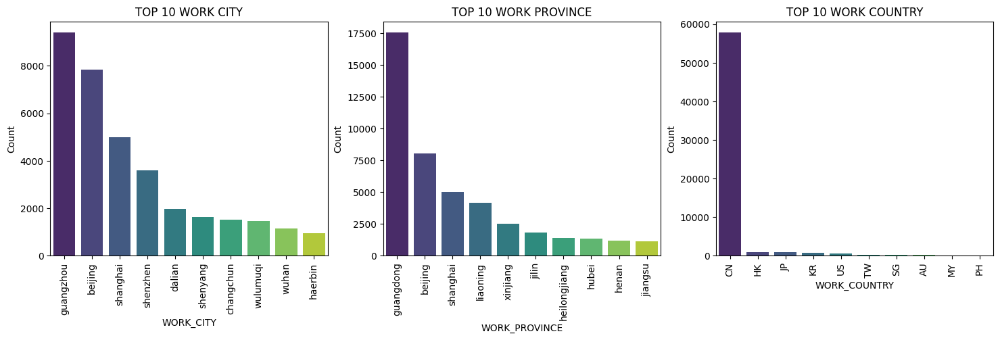

In [35]:
fig, ax = plt.subplots(nrows = 1,
                       ncols = 3,
                       figsize = (18, 4.5))

# Top 10 WORK_CITY
work_city_top10 = df['WORK_CITY'].value_counts().head(10)
# Membuat barplot
sns.barplot(x = work_city_top10.index,
            y = work_city_top10.values,
            ax = ax[0],
            palette = ('viridis'))
ax[0].set_title('TOP 10 WORK CITY')
ax[0].set_xlabel('WORK_CITY')
ax[0].set_ylabel('Count')
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation = 90)

# Top 10 WORK_PROVINCE
work_province_top10 = df['WORK_PROVINCE'].value_counts().head(10)
# Membuat barplot
sns.barplot(x = work_province_top10.index,
            y = work_province_top10.values,
            ax = ax[1],
            palette = ('viridis'))
ax[1].set_title('TOP 10 WORK PROVINCE')
ax[1].set_xlabel('WORK_PROVINCE')
ax[1].set_ylabel('Count')
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation = 90)

# Top 10 WORK_COUNTRY
work_country_top10 = df['WORK_COUNTRY'].value_counts().head(10)
# Membuat barplot
sns.barplot(x = work_country_top10.index,
            y = work_country_top10.values,
            ax = ax[2],
            palette = ('viridis'))
ax[2].set_title('TOP 10 WORK COUNTRY')
ax[2].set_xlabel('WORK_COUNTRY')
ax[2].set_ylabel('Count')
ax[2].set_xticklabels(ax[2].get_xticklabels(), rotation = 90)
plt.show()

## 1.1.2. Multivariate Analysis

### 1.1.2.1. Distribusi Data

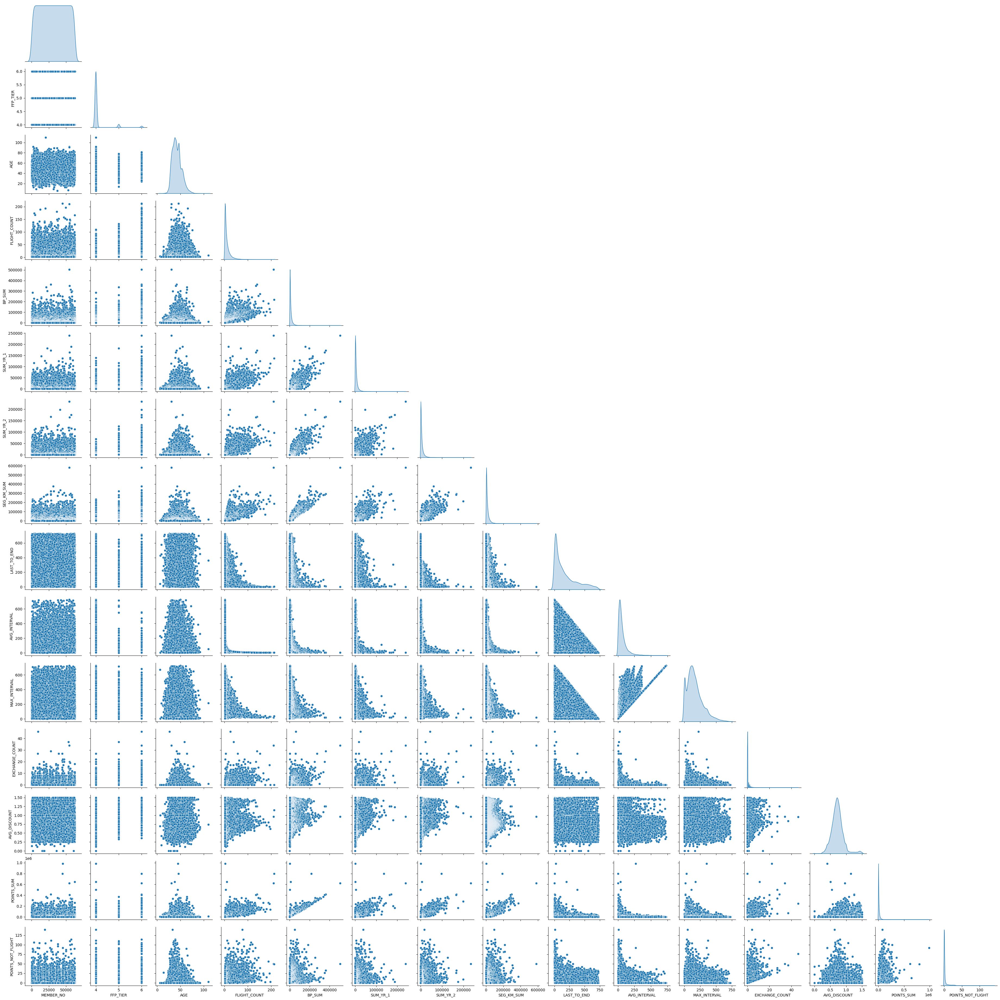

In [36]:
# Pengecekan distribusi setiap fitur dengan pairplot
rcParams['figure.figsize'] = 20, 20
sns.pairplot(df,
             diag_kind = 'kde',
            #  hue = 'FFP_TIER',  # Frequent Flyer Program (FFP)
             corner = True)
plt.show()



* Pairplot digunakan untuk menganalisis antara dua variabel pada data (*bivariate analysis*). 
* Pada bagian scatterplot dapat dilihat sebaran data dari dua variabel yang dipilih.
* Scatterplot dengan sebaran warna biru mengindikasikan bahwa dataset memiliki kombinasi fitur yang baik.



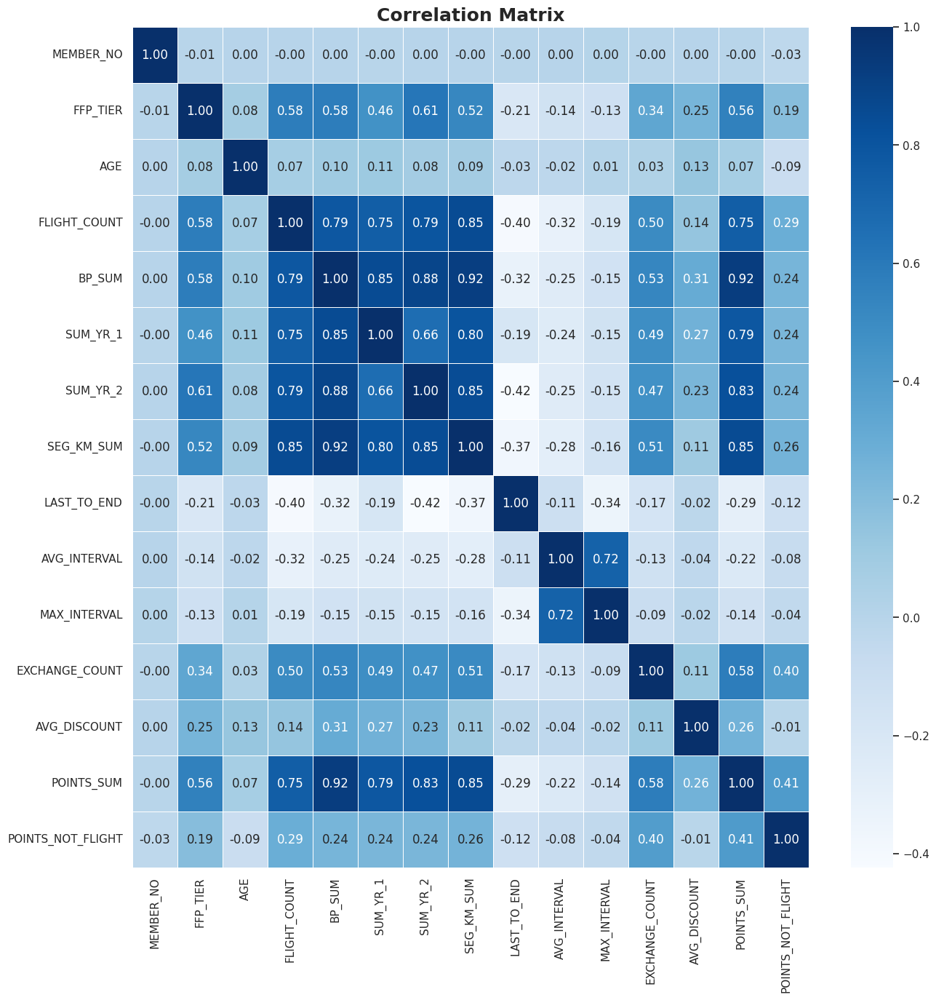

In [37]:
# Pengecekan korelasi antar fitur dengan Correlation Heatmap
sns.set(rc = {'figure.figsize': (15, 15)})
sns.heatmap(data = df.corr(),
            cmap = 'Blues',
            annot = True,
            fmt = '.2f',
            linewidths = 0.5)
plt.title(label = 'Correlation Matrix',
          fontsize = 18,
          fontweight = 'bold')
plt.show()

- Antarfitur `FLIGHT_COUNT`, `BP_SUM`, `SUM_YR_1`, `SUM_YR_2`, `SEG_KM_SUM`, dan `POINTS_SUM`.
- Antara fitur `AVG_INTERVAL` dengan `MAX_INTERVAL` berkorelasi kuat.

# 2. Feature Engineering

In [38]:
categorical = ['GENDER','FFP_TIER','WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY']
numerical = ['MEMBER_NO', 'AGE', 'FLIGHT_COUNT', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2', 'SEG_KM_SUM', 'LAST_TO_END', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT',
       'AVG_DISCOUNT', 'POINTS_SUM', 'POINTS_NOT_FLIGHT']
date = ['FFP_DATE', 'FIRST_FLIGHT_DATE', 'LOAD_TIME', 'LAST_FLIGHT_DATE']

###2.1. Fixing Data Type

In [39]:
# Mengganti tanggal 29 Februari 2014 menjadi 28 Februari 2014, karena bulan Februari 2014 hanya sampai tanggal 28 (bukan tahun kabisat)
df['LAST_FLIGHT_DATE'] = df['LAST_FLIGHT_DATE'].replace('2014/2/29  0:00:00', '2014/2/28  0:00:00')

# Mengubah kolom tanggal bertipe object menjadi datetime 
for col in date:
  df[col]= pd.to_datetime(df[col], errors = 'coerce')

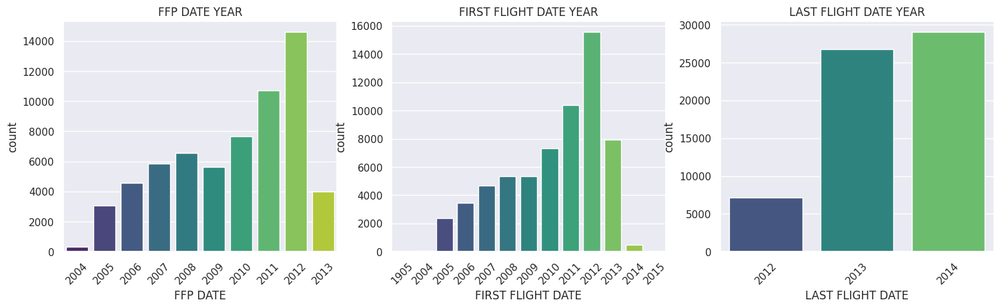

In [40]:
fig, ax = plt.subplots(nrows = 1,
                       ncols = 3,
                       figsize = (18, 4.5))

sns.countplot(x = df['FFP_DATE'].dt.year,
              ax = ax[0],
              palette = ('viridis'))
ax[0].tick_params(axis = 'x')
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation = 45)
ax[0].set_xlabel('FFP DATE')
ax[0].set_title('FFP DATE YEAR')

sns.countplot(x = df['FIRST_FLIGHT_DATE'].dt.year,
              ax = ax[1],
              palette = ('viridis'))
ax[1].tick_params(axis = 'x')
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation = 45)
ax[1].set_xlabel('FIRST FLIGHT DATE')
ax[1].set_title('FIRST FLIGHT DATE YEAR')

sns.countplot(x = df['LAST_FLIGHT_DATE'].dt.year,
              ax = ax[2],
              palette = ('viridis'))
ax[2].tick_params(axis = 'x')
ax[2].set_xticklabels(ax[2].get_xticklabels(), rotation = 45)
ax[2].set_xlabel('LAST FLIGHT DATE')
ax[2].set_title('LAST FLIGHT DATE YEAR')
plt.show()

###2.2. Handle Missing Values

Sebelum _handle missing value_, kami memutuskan untuk menghapus fitur kategorikal yang memiliki banyak nilai unik (kategori) dengan tipe data nominal (`WORK_CITY`,`WORK_PROVINCE`, dan `WORK_COUNTRY`) untuk menghindari bias setelah _encoding_.

In [41]:
df_clean = df.drop(['WORK_CITY', 'WORK_PROVINCE', 'WORK_COUNTRY'], axis = 1)

In [42]:
df_clean.isna().sum().sort_values(ascending = False)

SUM_YR_1             551
AGE                  420
SUM_YR_2             138
GENDER                 3
LAST_FLIGHT_DATE       0
POINTS_SUM             0
AVG_DISCOUNT           0
EXCHANGE_COUNT         0
MAX_INTERVAL           0
AVG_INTERVAL           0
LAST_TO_END            0
MEMBER_NO              0
SEG_KM_SUM             0
FFP_DATE               0
BP_SUM                 0
FLIGHT_COUNT           0
LOAD_TIME              0
FFP_TIER               0
FIRST_FLIGHT_DATE      0
POINTS_NOT_FLIGHT      0
dtype: int64

In [43]:
print (f'Persentase data yang kosong: {round(df_clean.isna().sum().sum() / len(df) * 100, 2)}%.')

Persentase data yang kosong: 1.77%.


In [44]:
# Penghapusan data yang kosong, karena hanya 1,77% (masih banyak data yang bisa digunakan untuk training)
df_clean = df_clean.dropna()
print(f'Jumlah data yang kosong dalam dataset: {df_clean.isna().sum().sum()}')

Jumlah data yang kosong dalam dataset: 0


In [45]:
df_clean.dtypes

MEMBER_NO                     int64
FFP_DATE             datetime64[ns]
FIRST_FLIGHT_DATE    datetime64[ns]
GENDER                       object
FFP_TIER                      int64
AGE                         float64
LOAD_TIME            datetime64[ns]
FLIGHT_COUNT                  int64
BP_SUM                        int64
SUM_YR_1                    float64
SUM_YR_2                    float64
SEG_KM_SUM                    int64
LAST_FLIGHT_DATE     datetime64[ns]
LAST_TO_END                   int64
AVG_INTERVAL                float64
MAX_INTERVAL                  int64
EXCHANGE_COUNT                int64
AVG_DISCOUNT                float64
POINTS_SUM                    int64
POINTS_NOT_FLIGHT             int64
dtype: object

###2.3. Handle Duplicate Values

In [46]:
# Check Duplicated Data
print(f'Jumlah data yang duplikat dalam dataset: {df_clean.duplicated().sum()}')

Jumlah data yang duplikat dalam dataset: 0


Tidak melakukan _handle duplicate value_, karena tidak ada data yang duplikat.

###2.4. Feature Selection

Fitur `GENDER` akan dilakukan _encoding_, karena merupakan data kategorikal yang hanya memiliki nilai unik Male dan Female.

In [47]:
mapping_gender = {'Male'   : 0,
                  'Female' : 1}
df_clean['GENDER'] = df_clean['GENDER'].map(mapping_gender)
df_clean['GENDER'].value_counts()

<ipython-input-47-7bb677e22d07>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['GENDER'] = df_clean['GENDER'].map(mapping_gender)


0    47320
1    14561
Name: GENDER, dtype: int64

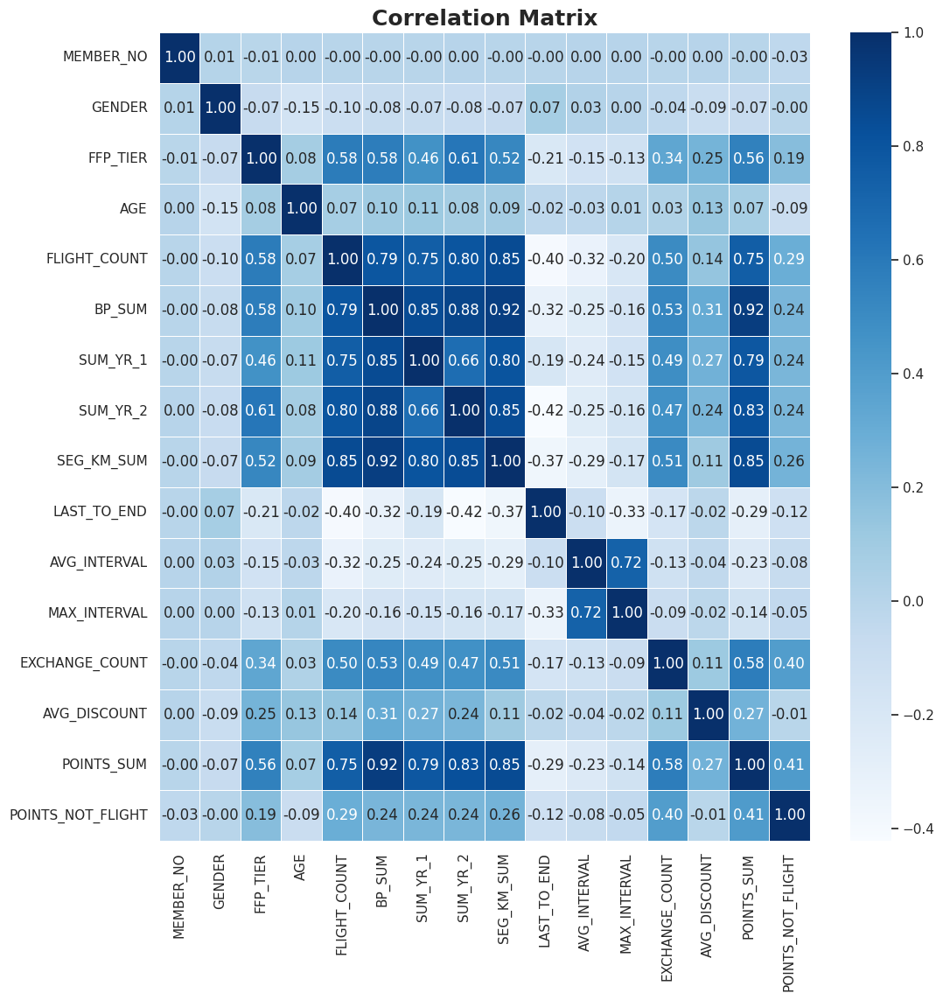

In [48]:
# Membuat heatmap untuk melihat apakah fitur Gender mempunyai korelasi
sns.set(rc = {'figure.figsize': (12, 12)})
sns.heatmap(data = df_clean.corr(),
            cmap = 'Blues',
            annot = True,
            fmt = '.2f',
            linewidths = 0.5)
plt.title(label = 'Correlation Matrix',
          fontsize = 18,
          fontweight = 'bold')
plt.show()

Dari heatmap dapat disimpulkan bahwa fitur `GENDER` dan `AGE` memiliki korelasi antarfitur yang sangat kecil, sehingga fitur tersebut akan dihapus.

In [49]:
df_clean = df_clean.drop(columns = ['GENDER', 'AGE'])

In [50]:
df_clean.dtypes

MEMBER_NO                     int64
FFP_DATE             datetime64[ns]
FIRST_FLIGHT_DATE    datetime64[ns]
FFP_TIER                      int64
LOAD_TIME            datetime64[ns]
FLIGHT_COUNT                  int64
BP_SUM                        int64
SUM_YR_1                    float64
SUM_YR_2                    float64
SEG_KM_SUM                    int64
LAST_FLIGHT_DATE     datetime64[ns]
LAST_TO_END                   int64
AVG_INTERVAL                float64
MAX_INTERVAL                  int64
EXCHANGE_COUNT                int64
AVG_DISCOUNT                float64
POINTS_SUM                    int64
POINTS_NOT_FLIGHT             int64
dtype: object

Untuk analisis lebih lanjut, kami akan menerapkan [RFM analysis](https://algorit.ma/blog/rfm-analysis-2022/), yaitu model analisis data yang diperkenalkan oleh Jan Roelf Bult dan Tom Wansbeek pada tahun 1995.

Model ini digunakan untuk melakukan segmentasi pelanggan secara efektif, yaitu berdasarkan analisis perilaku pelanggan pada 3 parameter:
- R (Recency) = waktu interaksi terakhir pelanggan melakukan penerbangan.
- F (Frequency) = jumlah penerbangan yang dilakukan setiap pelanggan.
- M (Monetary Value) = jumlah total jarak penerbangan yang dilakukan setiap pelanggan.

Kami juga melakukan modikasi model RFM dengan menambahkan 2 parameter, yaitu:
- L (Loyalty or Length Relation) = apakah customer baru atau lama.
- C (Campaign or Coefficient Value) = koefisien rerata diskon yang didapatkan oleh pelanggan.
Dengan kata lain, metode ini disebut dengan LRFMC (Loyalty, Recency, Frequency, Monetary, and Campaign).

Oleh karena itu, kami akan memilih fitur:
- (`LOAD_TIME` - `FFP_DATE`) (Loyalty), _length relation_, jarak waktu registrasi dan data didapatkan
- `LAST_TO_END` (Recency), waktu transaksi terakhir pelanggan
- `FLIGHT_COUNT` (Frequency), total transaksi yang dilakukan oleh pelanggan
- `SEG_KM_SUM` (Monetary), total jarak penerbangan (km)
- `AVG_DISCOUNT` (Campaign), rerata diskon yang didapatkan


In [51]:
df_clean = df_clean.drop(columns = ['FFP_TIER', 'BP_SUM', 'SUM_YR_1', 'SUM_YR_2',
                                    'LAST_FLIGHT_DATE', 'AVG_INTERVAL', 'MAX_INTERVAL', 'EXCHANGE_COUNT',
                                    'FIRST_FLIGHT_DATE', 'POINTS_SUM', 'POINTS_NOT_FLIGHT'])
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61881 entries, 0 to 62986
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   MEMBER_NO     61881 non-null  int64         
 1   FFP_DATE      61881 non-null  datetime64[ns]
 2   LOAD_TIME     61881 non-null  datetime64[ns]
 3   FLIGHT_COUNT  61881 non-null  int64         
 4   SEG_KM_SUM    61881 non-null  int64         
 5   LAST_TO_END   61881 non-null  int64         
 6   AVG_DISCOUNT  61881 non-null  float64       
dtypes: datetime64[ns](2), float64(1), int64(4)
memory usage: 3.8 MB


In [52]:
# Membuat kolom jumlah hari sejak bergabung dengan flyer program
df_clean['LENGTH_DAYS'] = (df_clean['LOAD_TIME'] - df_clean['FFP_DATE']).dt.days

In [53]:
# Menghapus kolom FFP_DATE dan LOAD_TIME, karena sudah membentuk kolom DAYS_JOIN
df_clean = df_clean.drop(columns = ['LOAD_TIME', 'FFP_DATE'])
df_clean.sample()

,MEMBER_NO,FLIGHT_COUNT,SEG_KM_SUM,LAST_TO_END,AVG_DISCOUNT,LENGTH_DAYS
42123,10963,5,7296,308,0.574301,373


In [54]:
df_clean.columns

Index(['MEMBER_NO', 'FLIGHT_COUNT', 'SEG_KM_SUM', 'LAST_TO_END',
       'AVG_DISCOUNT', 'LENGTH_DAYS'],
      dtype='object')

In [55]:
df_lrfmc = df_clean[['MEMBER_NO', 'LENGTH_DAYS', 'LAST_TO_END', 'FLIGHT_COUNT', 'SEG_KM_SUM', 'AVG_DISCOUNT']]
df_lrfmc.columns = ['MEMBER_NO', 'L', 'R', 'F', 'M', 'C']
df_lrfmc.sample()

,MEMBER_NO,L,R,F,M,C
47198,37634,816,72,4,4242,0.760879


In [56]:
df_lrfmc.describe().T

,count,mean,std,min,25%,50%,75%,max
MEMBER_NO,61881.0,31485.945928,18191.873222,1.0,15713.000000,31483.000000,47254.000000,62988.0
L,61881.0,1483.872481,847.272325,365.0,732.000000,1267.000000,2178.000000,3437.0
R,61881.0,172.621483,181.238007,1.0,29.000000,105.000000,260.000000,731.0
F,61881.0,11.963301,14.114609,2.0,3.000000,7.000000,15.000000,213.0
M,61881.0,17301.548456,21038.022931,368.0,4865.000000,10181.000000,21494.000000,580717.0
C,61881.0,0.721674,0.184837,0.0,0.612642,0.711836,0.808889,1.5


###2.4. Handle Outlier

In [57]:
features = ['L', 'R', 'F', 'M', 'C']

#### Train-Test Split

In [58]:
X = df_lrfmc[features]

# Split the data
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(X, test_size = 0.2, random_state = 400)

# Check the shapes
print(f'Shape of X_train: {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')

Shape of X_train: (49504, 5)
Shape of X_test : (12377, 5)


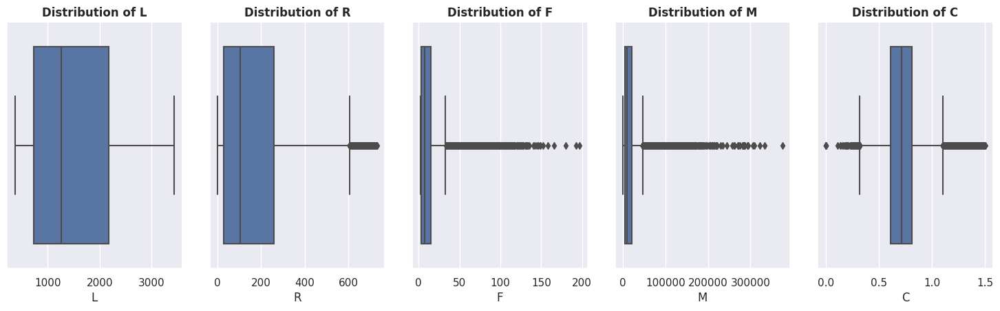

In [59]:
# Menampilkan boxplot sebelum handle outliers
from matplotlib import rcParams
rcParams['figure.figsize'] = 15, 5

df_feature = X_train[features].columns
for i in range(0, len(df_feature)):
    plt.subplot(1, 5, i + 1)
    sns.boxplot(x = X_train[df_feature[i]],
                orient = 'h')
    plt.title('Distribution of ' + df_feature[i],
              fontsize = 12,
              fontweight = 'bold')
    plt.tight_layout(pad = 2)

Terlebih dahulu, kami akan membandingkan hasil dari metode IQR dan Z-Score dan menentukan metode mana yang lebih cocok untuk menangani _outlier_ pada dataset yang sedang dianalisis.

####Handle Outlier with IQR


In [60]:
X_train_iqr = X_train.copy()

In [61]:
print(f'Jumlah baris sebelum memfilter outlier: {len(X_train_iqr)}')

# Menghitung Q1, Q3, dan IQR
Q1 = X_train_iqr[features].quantile(0.25)
Q3 = X_train_iqr[features].quantile(0.75)
IQR = Q3 - Q1

# Menentukan batas bawah dan batas atas
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Membuat mask untuk menghilangkan outlier
mask = ((X_train_iqr[features] >= lower_bound) &
        (X_train_iqr[features] <= upper_bound)).all(axis = 1)
X_train_iqr = X_train_iqr[mask].reset_index(drop = True)

print(f'Jumlah baris sesudah memfilter outlier: {len(X_train_iqr)}')

Jumlah baris sebelum memfilter outlier: 49504
Jumlah baris sesudah memfilter outlier: 41546


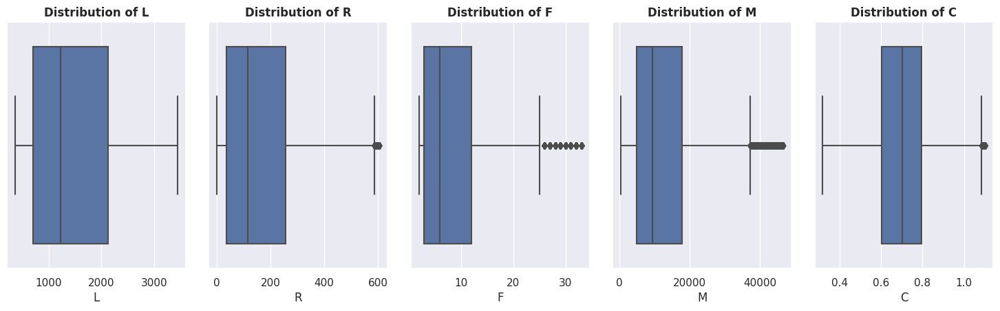

In [62]:
# Menampilkan boxplot setelah handle outliers dengan IQR
from matplotlib import rcParams
rcParams['figure.figsize'] = 15, 5

df_feature = X_train_iqr[features].columns
for i in range(0, len(df_feature)):
    plt.subplot(1, 5, i + 1)
    sns.boxplot(x = X_train_iqr[df_feature[i]],
                orient = 'h')
    plt.title('Distribution of ' + df_feature[i],
              fontsize = 12,
              fontweight = 'bold')
    plt.tight_layout(pad = 2)

####Handle Outlier with Z-Score

In [63]:
X_train_zscore = X_train.copy()

In [64]:
from scipy import stats

print(f'Jumlah baris sebelum memfilter outlier: {len(X_train_zscore)}')

# Handle outlier with Z-Score
col = X_train_zscore[features].columns
for col in features:
    z_scores = stats.zscore(X_train_zscore[col])
    z_abs = np.abs(z_scores)
    threshold = 3
    X_train_zscore = X_train_zscore[z_abs < threshold]

print(f'Jumlah baris sesudah memfilter outlier: {len(X_train_zscore)}')

Jumlah baris sebelum memfilter outlier: 49504
Jumlah baris sesudah memfilter outlier: 46535


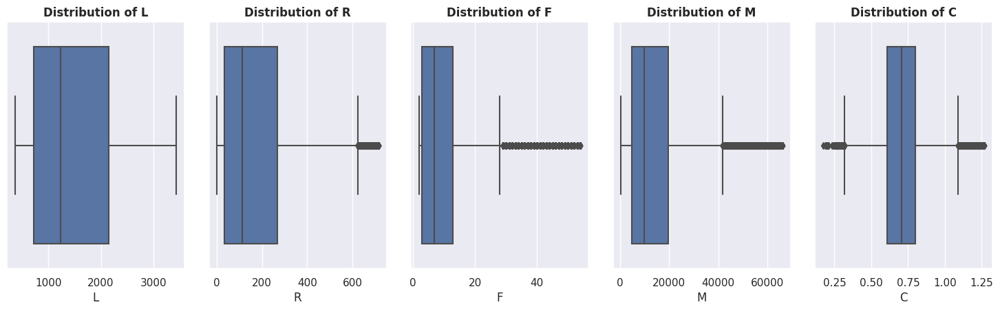

In [65]:
# tampilan boxplot setelah handle outliers dengan Z-score
from matplotlib import rcParams
rcParams['figure.figsize'] = 15, 5

df_num_zscore = X_train_zscore[features].columns
for i in range(0, len(df_num_zscore)):
    plt.subplot(1, 5, i + 1)
    sns.boxplot(x = X_train_zscore[df_num_zscore[i]],
                orient = 'h')
    plt.title('Distribution of ' + df_num_zscore[i],
              fontsize = 12,
              fontweight = 'bold')
    plt.tight_layout(pad = 2)

Berdasarkan kedua hasil tersebut di atas, kami akan menggunakan hasil _handle outlier_ dengan IQR.

###2.6. Feature Standardization

In [66]:
X_train_iqr.columns

Index(['L', 'R', 'F', 'M', 'C'], dtype='object')

In [67]:
X_train_iqr.shape

(41546, 5)

In [68]:
a = X_train_iqr[features].values
b = X_test[features].values

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(a)

a_std = scaler.transform(a) # Fitting and transforming the train data
b_std = scaler.transform(b) # Transforming the test data with the scaler fitted on train data

X_train_std = pd.DataFrame(data = a_std, columns = features)
X_test_std = pd.DataFrame(data = b_std, columns = features)

In [69]:
X_train_std.describe()

,L,R,F,M,C
count,4.154600e+04,4.154600e+04,4.154600e+04,4.154600e+04,4.154600e+04
mean,1.556332e-17,7.456714e-17,-4.344049e-17,-1.265589e-17,5.815724e-16
std,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00
min,-1.291622e+00,-1.042789e+00,-9.734503e-01,-1.217866e+00,-2.630659e+00
25%,-8.808407e-01,-8.241616e-01,-8.319548e-01,-7.771649e-01,-6.575172e-01
50%,-2.598790e-01,-3.306872e-01,-4.074681e-01,-3.181847e-01,2.226296e-02
75%,8.149777e-01,5.500708e-01,4.415052e-01,5.173939e-01,6.734755e-01
max,2.387442e+00,2.736350e+00,3.412912e+00,3.399305e+00,2.791081e+00


In [70]:
X_test_std.describe()

,L,R,F,M,C
count,12377.000000,12377.000000,12377.000000,12377.000000,12377.000000
mean,0.058552,0.031746,0.436818,0.464482,0.147992
std,1.013901,1.140554,2.057272,2.117919,1.281821
min,-1.291622,-1.042789,-0.973450,-1.217866,-4.842741
25%,-0.842517,-0.867887,-0.831955,-0.768475,-0.619403
50%,-0.186226,-0.393152,-0.265973,-0.249263,0.077978
75%,0.884439,0.581303,0.724496,0.864775,0.754415
max,2.387442,3.504670,28.882112,56.751377,5.542517


Nilai mean telah mendekati 0 dan std mendekati 1.

# 3. Modeling and Evaluation

## 3.1. Klasterisasi Tanpa _Principal Component Analysis_ (PCA)

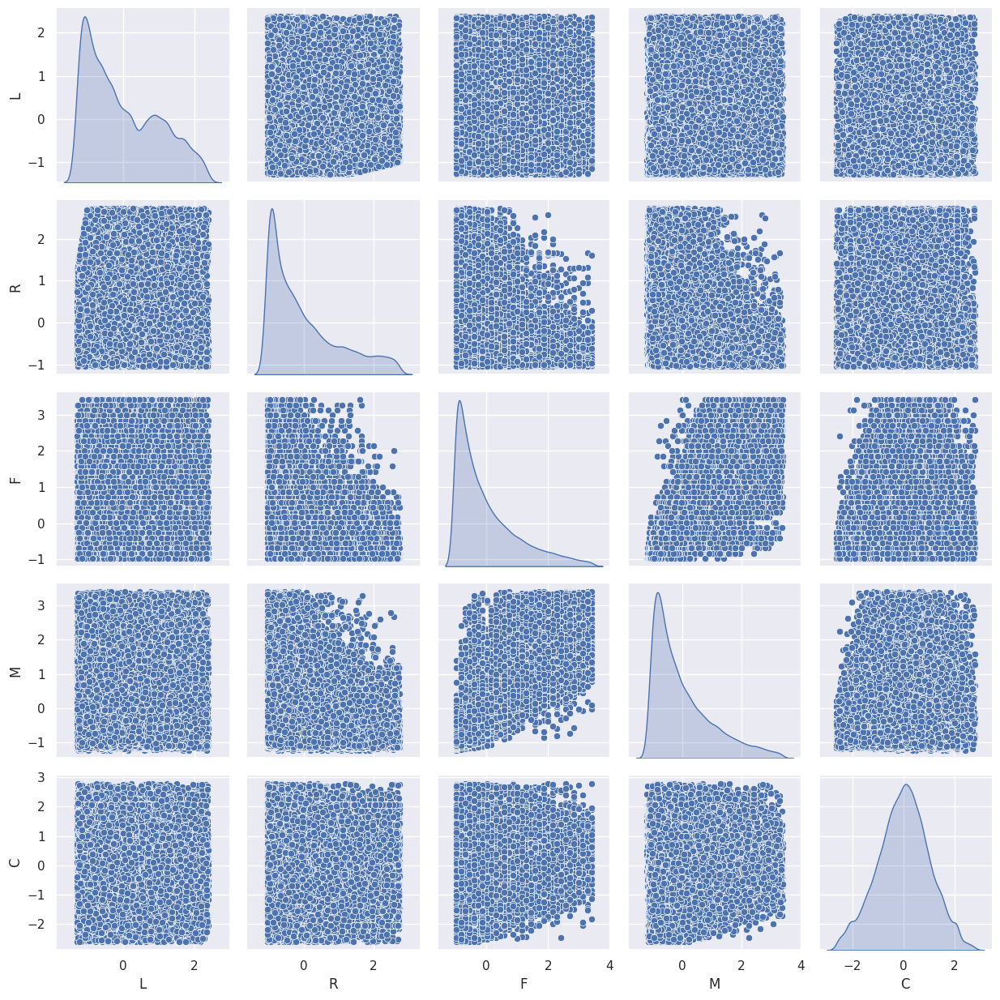

In [71]:
# Visualisasi data sebelum dilakukan PCA
sns.pairplot(X_train_std, diag_kind = 'kde')
plt.tight_layout()

### Inertia Score

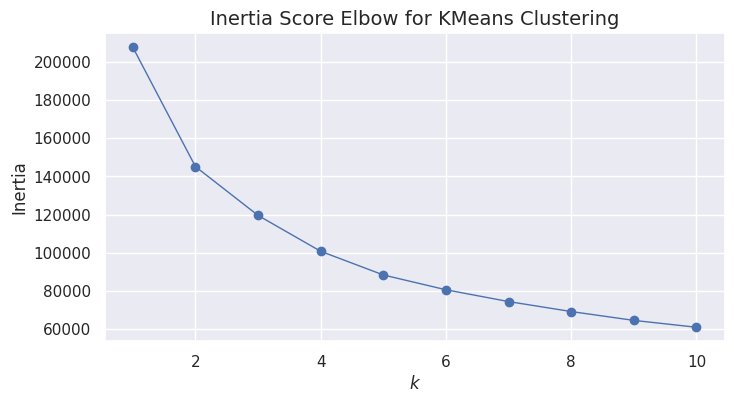

In [72]:
from sklearn.cluster import KMeans

# Menghitung nilai inertia untuk setiap k (dari 1 s.d. 10)
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10,
                    max_iter = 200, random_state = 400)
    kmeans.fit(X_train_std)
    inertia.append(kmeans.inertia_)

# Menampilkan plot
plt.figure(figsize = (8, 4))
plt.plot(range(1, 11),
         inertia,
         linewidth = 1,
         marker = 'o')
plt.xlabel('$k$', fontsize = 12)
plt.ylabel('Inertia', fontsize = 12)
plt.style.use('ggplot')
plt.title('Inertia Score Elbow for KMeans Clustering', fontsize = 14)
plt.show()

In [73]:
# Persentase dari inertia
(pd.Series(inertia) - pd.Series(inertia).shift(-1)) / pd.Series(inertia) * 100

0    30.108765
1    17.625702
2    15.722966
3    12.301346
4     8.783908
5     7.667562
6     7.025981
7     6.692905
8     5.572961
9          NaN
dtype: float64

- Dengan parameter _inertia score_, nilai optimal pada k = 2, karena terjadi penurunan inertia yang tidak terlalu signifikan setelah k = 2.

### Distortion Score

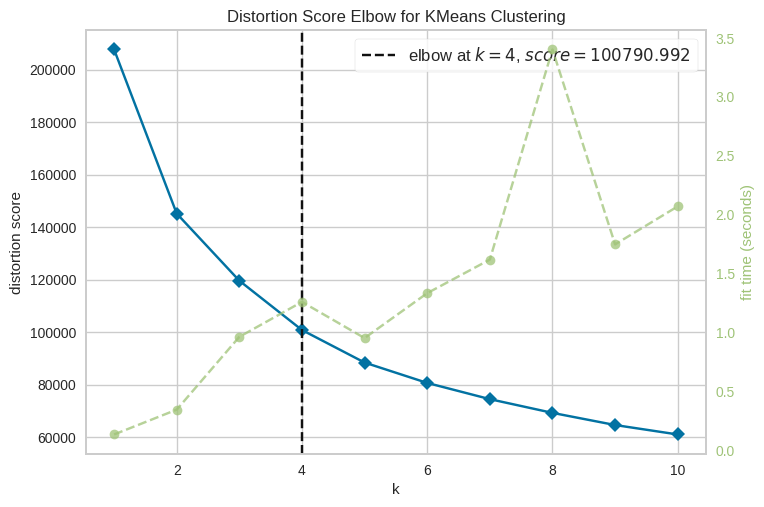

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [74]:
from yellowbrick.cluster import KElbowVisualizer

# Fit model
model = KMeans(init = 'k-means++', n_init = 10, max_iter = 200, random_state = 400)
visualizer = KElbowVisualizer(model, k = (1, 11), metric = 'distortion', timings = True, locate_elbow = True)
visualizer.fit(X_train_std)
visualizer.show()

- Dengan parameter _distortion score_, nilai optimal pada k = 4.

### Silhouette Score

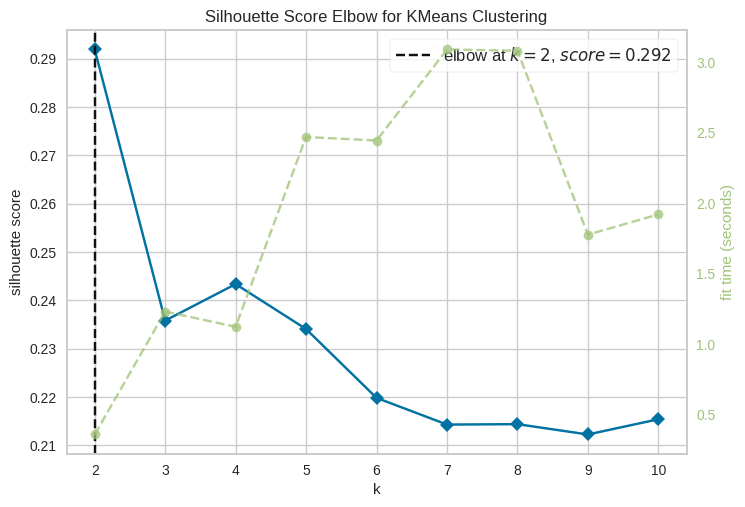

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [75]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(init = 'k-means++', n_init = 10, max_iter = 200, random_state = 400)
visualizer = KElbowVisualizer(model, k = (2, 11), metric = 'silhouette', timings = True, locate_elbow = True)
visualizer.fit(X_train_std)
visualizer.show()

- Dengan parameter _silhouette score_, nilai optimal pada k = 2. Namun, pada k = 4 memiliki nilai yang lebih baik dibandingkan k = 3, 5, dan selainnya.

## 3.2. Klasterisasi Dengan PCA

In [76]:
from sklearn.decomposition import PCA

# Melakukan PCA
pca = PCA(n_components = 4)
pca.fit(X_train_std)
X_pca = pca.transform(X_train_std)

pdf = pd.DataFrame(X_pca, columns = ['pc1', 'pc2', 'pc3', 'pc4'])
pdf.describe()

,pc1,pc2,pc3,pc4
count,4.154600e+04,4.154600e+04,4.154600e+04,4.154600e+04
mean,-2.360153e-17,8.294739e-18,2.005275e-17,4.104613e-18
std,1.474961e+00,1.014754e+00,9.731706e-01,8.332712e-01
min,-2.803774e+00,-2.958982e+00,-2.825984e+00,-2.042844e+00
25%,-1.059200e+00,-6.892419e-01,-7.500038e-01,-6.265803e-01
50%,-3.007833e-01,-2.221881e-02,-1.221640e-01,-9.410167e-02
75%,8.671754e-01,6.793430e-01,6.909292e-01,5.640508e-01
max,4.941502e+00,3.937436e+00,3.356625e+00,4.087242e+00


Explained variance: [2.17551011 1.02972603 0.94706098 0.69434083]
Explained variance ratio: [0.43509155 0.20594025 0.18940764 0.13886482]


<BarContainer object of 4 artists>

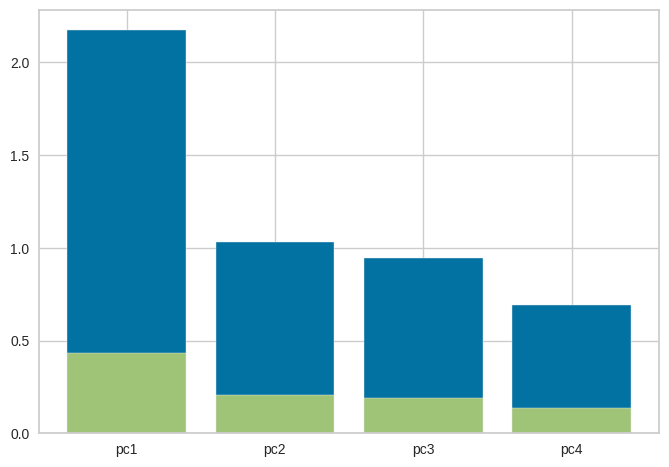

In [77]:
# Scree plot untuk menentukan jumlah PC yang akan diambil
print('Explained variance:', pca.explained_variance_)
print('Explained variance ratio:', pca.explained_variance_ratio_)

plt.bar(['pc1', 'pc2', 'pc3', 'pc4'], pca.explained_variance_)
plt.bar(['pc1', 'pc2', 'pc3', 'pc4'], pca.explained_variance_ratio_)

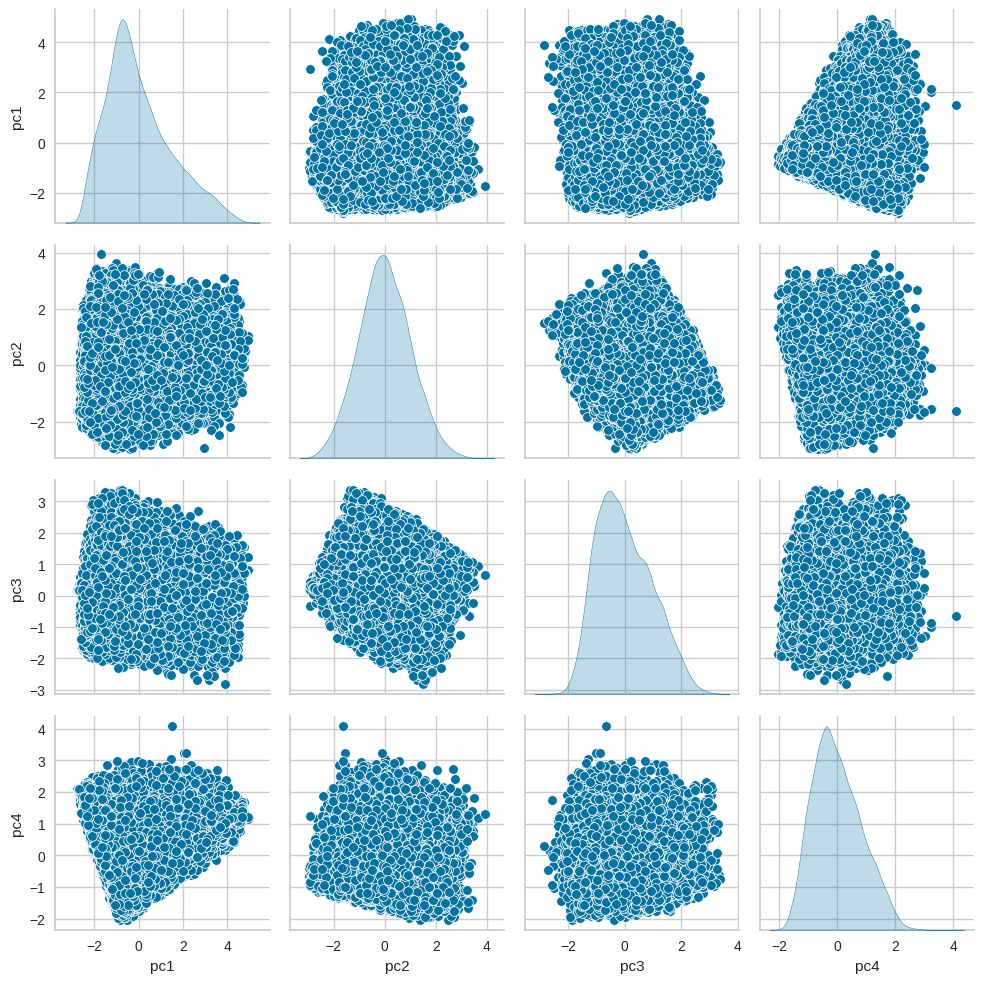

In [78]:
# Visualisasi data sesudah dilakukan PCA
sns.pairplot(pdf, diag_kind = 'kde')
plt.tight_layout()

### Inertia Score

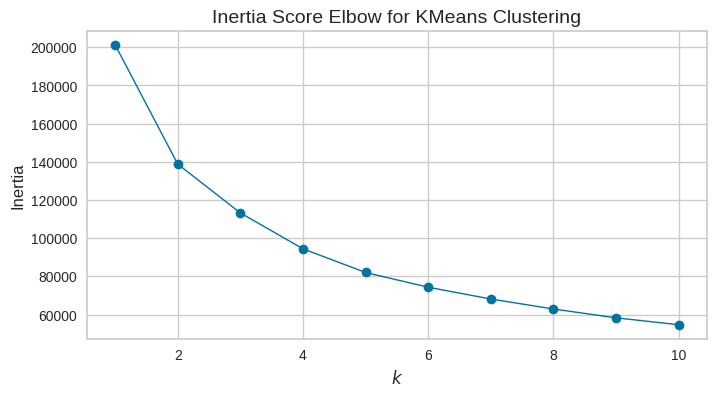

In [79]:
from sklearn.cluster import KMeans

# Menghitung nilai inertia untuk setiap k (dari 1 s.d. 10)
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10,
                    max_iter = 200, random_state = 400)
    kmeans.fit(pdf)
    inertia.append(kmeans.inertia_)

# Menampilkan plot
plt.figure(figsize = (8, 4))
plt.plot(range(1, 11),
         inertia,
         linewidth = 1,
         marker = 'o')
plt.xlabel('$k$', fontsize = 12)
plt.ylabel('Inertia', fontsize = 12)
plt.style.use('ggplot')
plt.title('Inertia Score Elbow for KMeans Clustering', fontsize = 14)
plt.show()

In [80]:
# Persentase dari inertia
(pd.Series(inertia) - pd.Series(inertia).shift(-1)) / pd.Series(inertia) * 100

0    31.062081
1    18.424387
2    16.599831
3    13.125164
4     9.414865
5     8.318941
6     7.673425
7     7.367192
8     6.183333
9          NaN
dtype: float64

- Dengan parameter _inertia score_, nilai optimal pada k = 2.

### Distortion Score

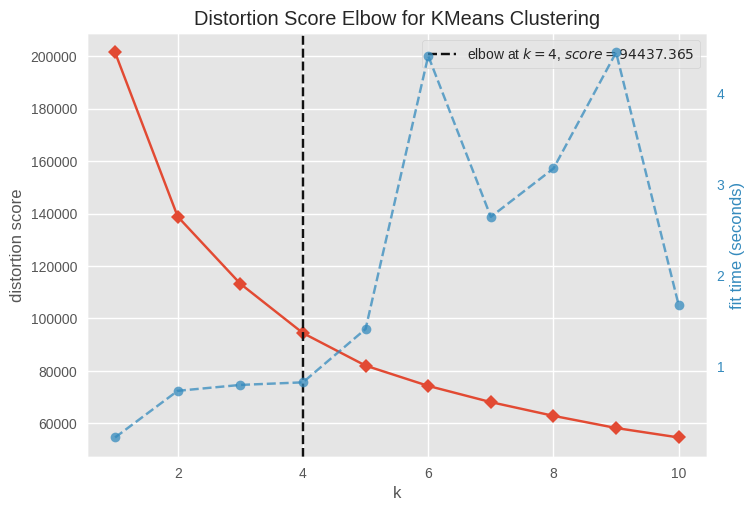

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [81]:
from yellowbrick.cluster import KElbowVisualizer

# Fit model
model = KMeans(init = 'k-means++', n_init = 10, max_iter = 200, random_state = 400)
visualizer = KElbowVisualizer(model, k = (1, 11), metric = 'distortion', timings = True, locate_elbow = True)
visualizer.fit(pdf)
visualizer.show()

- Dengan parameter _distortion score_, nilai optimal pada k = 4.

### Silhouette Score

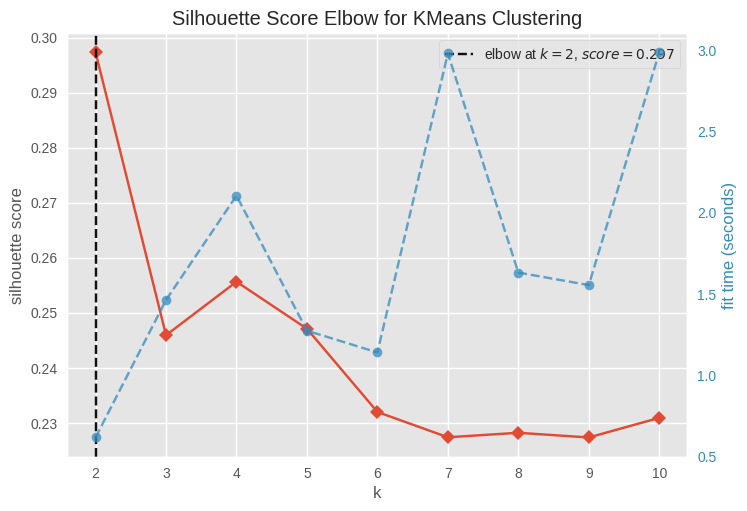

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [82]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(init = 'k-means++', n_init = 10, max_iter = 200, random_state = 400)
visualizer = KElbowVisualizer(model, k = (2, 11), metric = 'silhouette', timings = True, locate_elbow = True)
visualizer.fit(pdf)
visualizer.show()

### Silhouette Plot

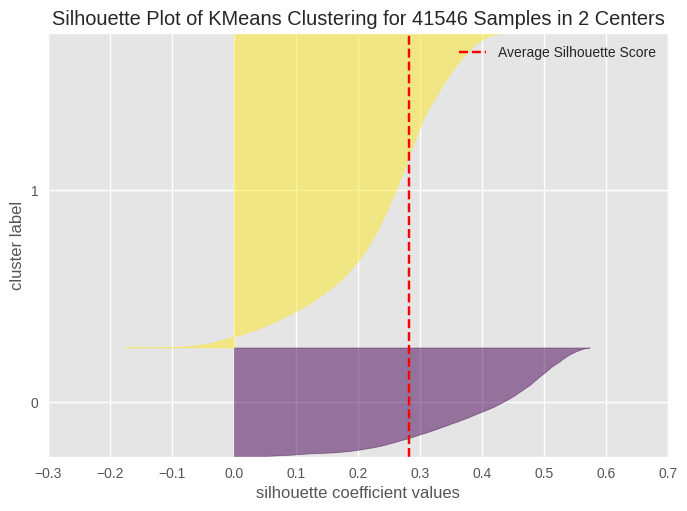

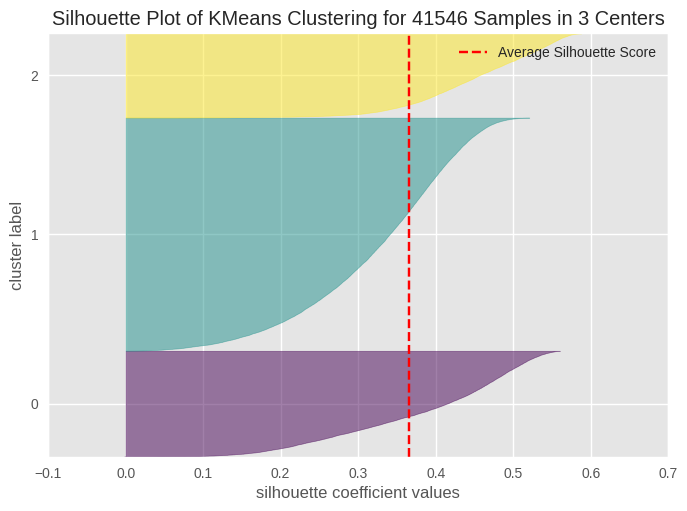

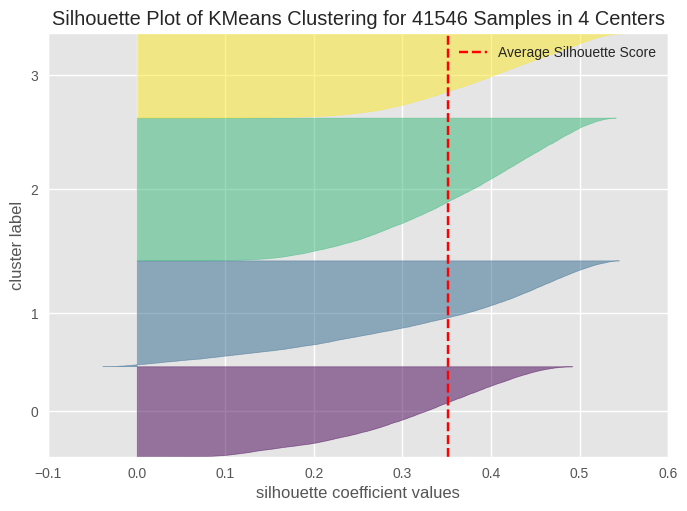

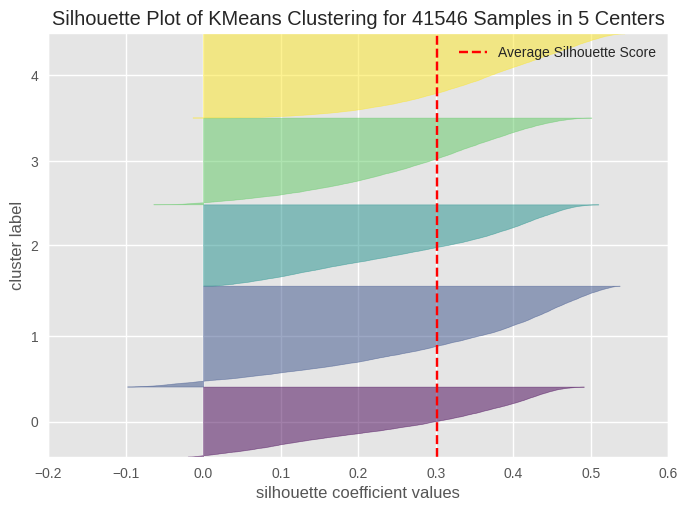

In [95]:
from yellowbrick.cluster import SilhouetteVisualizer

for i in [2, 3, 4, 5]:
    model = KMeans(i, init = 'k-means++', n_init = 10, max_iter = 200, random_state = 400)
    visualizer = SilhouetteVisualizer(model, colors = 'viridis')
    visualizer.fit(pdf)        
    visualizer.show()

Seperti yang dapat dilihat, Berdasarkan kedua analisis dengan maupun tenpa PCA menunjukkan hasil yang mirip, yaitu nilai optimal pada k = 2. Akan tetapi, kita akan menggunakan k = 4 sebagai jumlah klaster pada klasterisasi KMeans, karena memiliki _silhouette score_ tertinggi kedua. Selain itu, k = 4 lebih baik digunakan untuk segmentasi pelanggan.

## K-Means Clustering

In [97]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters = 4,
            init = 'k-means++', # Mempercepat kovergensi
            n_init = 10,
            max_iter = 200,
            random_state = 400)
km.fit(X_train_std.values)

KMeans(max_iter=200, n_clusters=4, n_init=10, random_state=400)

### Summary Statistics

In [99]:
# Labels
X_train_std['labels'] = km.labels_
X_train_std.groupby('labels').agg(['std', 'mean', 'median'])

L                             R                             F  \
             std      mean    median       std      mean    median       std   
labels                                                                         
0       0.555327  1.205213  1.161087  0.632839 -0.263729 -0.386906  0.542797   
1       0.801763 -0.322679 -0.553893  0.631147  1.608372  1.574499  0.347883   
2       0.440938 -0.692823 -0.768265  0.501722 -0.383089 -0.468110  0.513631   
3       0.970366  0.202090  0.050901  0.458633 -0.655754 -0.836655  0.807011   

                                   M                             C            \
            mean    median       std      mean    median       std      mean   
labels                                                                         
0      -0.299774 -0.407468  0.568654 -0.298280 -0.396196  1.006019  0.038768   
1      -0.700464 -0.831955  0.449951 -0.667258 -0.797042  1.151188  0.132215   
2      -0.318533 -0.407468  0.550387 -0.320454 -0.418921  0.987931 -0.184161   
3       1.588430  1.431974  0.783336  1.556808  1.454607  0.776613  0.145446   

                  
          median  
labels            
0       0.055827  
1       0.195732  
2      -0.147264  
3       0.115244

In [100]:
X_train_std.groupby('labels').count()

,L,R,F,M,C
labels,,,,,
0,9448,9448,9448,9448,9448
1,8599,8599,8599,8599,8599
2,14930,14930,14930,14930,14930
3,8569,8569,8569,8569,8569


In [101]:
# Centroids
km.cluster_centers_

array([[ 1.20404316, -0.26399216, -0.29958784, -0.29887811,  0.04032715],
       [-0.32276654,  1.60720966, -0.70017613, -0.66730214,  0.13488211],
       [-0.69321593, -0.38312569, -0.31876656, -0.32002493, -0.18733649],
       [ 0.2023125 , -0.65587968,  1.58819536,  1.55659406,  0.14608277]])

In [102]:
# Melakukan PCA untuk melihat visualisasi
from sklearn.decomposition import PCA 
pca = PCA(n_components = 2)

pca.fit(X_train_std)
pca_tf = pca.transform(X_train_std)
pca_df = pd.DataFrame(data = pca_tf, columns = ['pc1', 'pc2'])
pca_df['labels'] = pdf['labels']
pca_df.sample(n = 5, random_state = 400)

,pc1,pc2,labels
13370,2.277939,0.244677,3
37791,-0.953768,1.826493,0
39337,-1.738044,-0.391529,1
33835,-0.528160,-0.530864,2
5293,0.257807,-0.963170,2


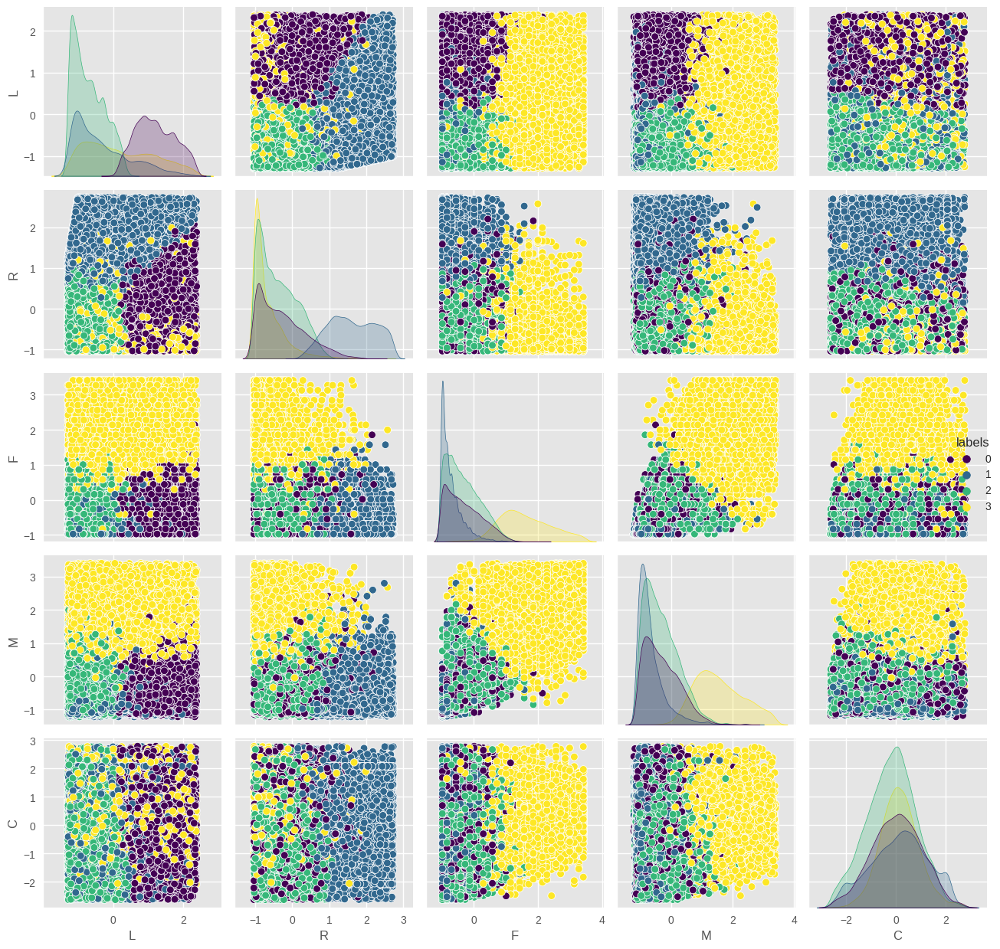

In [105]:
# Visualisasi dengan pairplot
sns.pairplot(data = X_train_std,
             hue = 'labels',
             diag_kind = 'kde',
             palette = 'viridis')
plt.tight_layout()

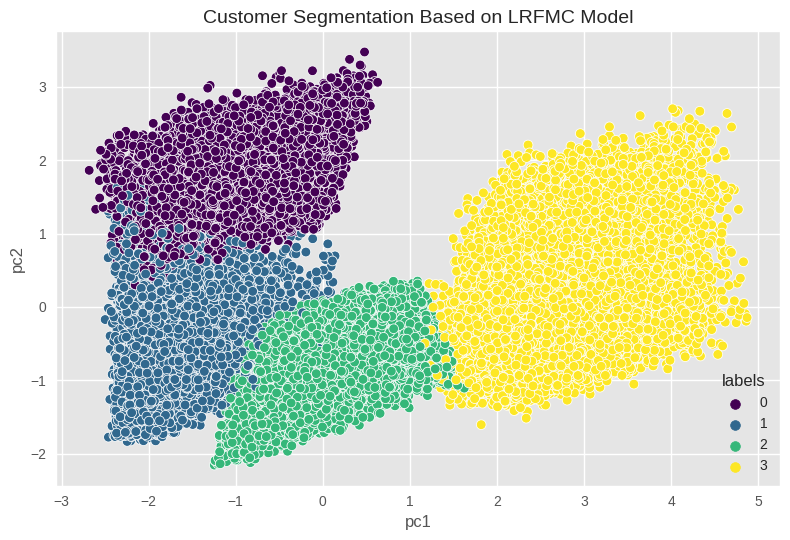

In [107]:
# Visualisasi hasil segmentasi dengan scatterplot
sns.scatterplot(data = pca_df,
                x = 'pc1',
                y = 'pc2',
                hue = 'labels',
                palette = 'viridis')
plt.title('Customer Segmentation Based on LRFMC Model', fontsize = 14)
plt.tight_layout()
plt.show()

# 4. Model Interpretation and Recommendation